link: https://towardsdatascience.com/a-step-by-step-guide-in-detecting-causal-relationships-using-bayesian-structure-learning-in-python-c20c6b31cee5

--> implement bayesian network to learn causal relationships


https://erdogant.github.io/bnlearn/pages/html/Examples.html


[df2onehot] >Auto detecting dtypes.


100%|██████████| 25/25 [00:00<00:00, 861.92it/s]


[df2onehot] >Set dtypes in dataframe..


100%|██████████| 25/25 [00:00<00:00, 1453.23it/s]

[df2onehot] >Total onehot features: 30
[bnlearn] >Computing best DAG using [hc]
[bnlearn] >Set scoring type at [bic]


[bnlearn] >Compute structure scores ['k2', 'bds', 'bic', 'bdeu'] for model comparison (higher is better).
[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.
[bnlearn] >Plot based on Bayesian model


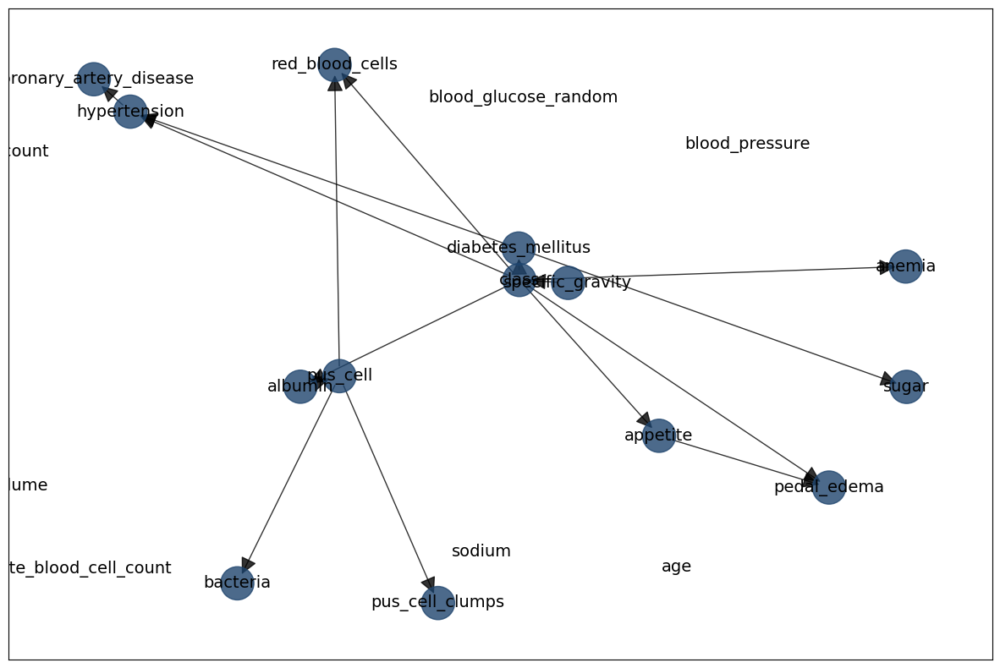

In [3]:
# !pip install bnlearn
import bnlearn as bn
import pandas as pd
# Load sprinkler dataset

# Print to screen for illustration
df = pd.read_csv('imputed/MICE.csv')
# Pre-processing of the input dataset
dfhot, dfnum = bn.df2onehot(df)

# Structure learning
DAG = bn.structure_learning.fit(df)

# Plot
G = bn.plot(DAG)
    
    

# # Learn the DAG in data using Bayesian structure learning:
# # Structure learning
# model = bn.structure_learning.fit(df, methodtype='hc', scoretype='bic')
# G = bn.plot(model)


In [4]:
# Parameter learning
model = bn.parameter_learning.fit(DAG, df)

[bnlearn] >Parameter learning> Computing parameters using [bayes]
[bnlearn] >Converting [<class 'pgmpy.base.DAG.DAG'>] to BayesianNetwork model.
[bnlearn] >Converting adjmat to BayesianNetwork.
[bnlearn] >CPD of specific_gravity:
+-------------------------+----------+
| specific_gravity(1.005) | 0.15493  |
+-------------------------+----------+
| specific_gravity(1.01)  | 0.214233 |
+-------------------------+----------+
| specific_gravity(1.015) | 0.2298   |
+-------------------------+----------+
| specific_gravity(1.02)  | 0.214233 |
+-------------------------+----------+
| specific_gravity(1.025) | 0.186805 |
+-------------------------+----------+
[bnlearn] >CPD of class:
+------------------+-----+-------------------------+
| specific_gravity | ... | specific_gravity(1.025) |
+------------------+-----+-------------------------+
| class(0.0)       | ... | 0.5595238095238095      |
+------------------+-----+-------------------------+
| class(1.0)       | ... | 0.44047619047619047     

In [5]:
print(df.head())


    age  blood_pressure  specific_gravity  albumin  sugar  red_blood_cells  \
0  48.0            80.0             1.020        1      0                1   
1   7.0            50.0             1.020        4      0                1   
2  62.0            80.0             1.010        2      3                1   
3  48.0            70.0             1.005        4      0                1   
4  51.0            80.0             1.010        2      0                1   

   pus_cell  pus_cell_clumps  bacteria  blood_glucose_random  ...  \
0         1                0         0            121.000000  ...   
1         1                0         0            129.842335  ...   
2         1                0         0            423.000000  ...   
3         0                1         0            117.000000  ...   
4         1                0         0            106.000000  ...   

   packed_cell_volume  white_blood_cell_count  red_blood_cell_count  \
0                44.0                  7800.0

In [7]:
# Print CPDs
CPDs = bn.print_CPD(model)
# Make inference
q = bn.inference.fit(model, variables=['class'], evidence={'appetite': 1, 'hypertension': 1, 'red_blood_cells':1})

## to do: we should split the data into training and test set and then do the inference on the test set 
# --> then we can validate the model and compare it to the other models (random forests, etc.)

print(q.df)
print(q._str())

[bnlearn] >Data is stored in [query.df]
+----+--------------------+----------+
|    |   specific_gravity |        p |
+====+====================+==========+
|  0 |                  0 | 0.15493  |
+----+--------------------+----------+
|  1 |                  1 | 0.214233 |
+----+--------------------+----------+
|  2 |                  2 | 0.2298   |
+----+--------------------+----------+
|  3 |                  3 | 0.214233 |
+----+--------------------+----------+
|  4 |                  4 | 0.186805 |
+----+--------------------+----------+
CPD of specific_gravity:
+-------------------------+----------+
| specific_gravity(1.005) | 0.15493  |
+-------------------------+----------+
| specific_gravity(1.01)  | 0.214233 |
+-------------------------+----------+
| specific_gravity(1.015) | 0.2298   |
+-------------------------+----------+
| specific_gravity(1.02)  | 0.214233 |
+-------------------------+----------+
| specific_gravity(1.025) | 0.186805 |
+-------------------------+----------+

[bnlearn] >Compute edge strength with [chi_square]
[bnlearn] >Set node properties.
[bnlearn]> Set edge weights based on the [chi_square] test statistic.
[bnlearn] >Set edge properties.
[bnlearn] >Plot based on Bayesian model


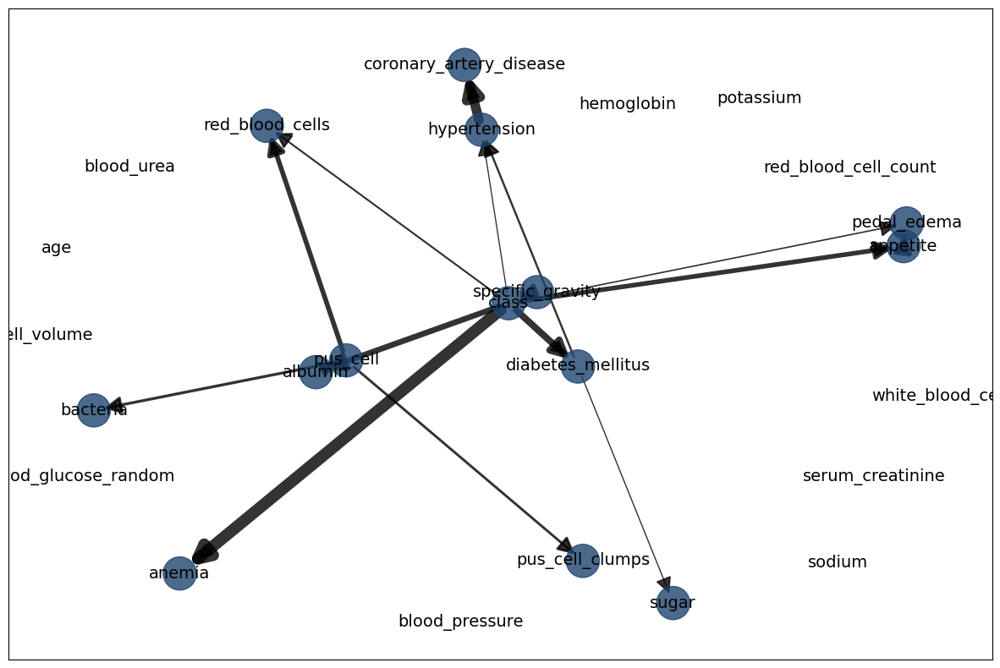

In [10]:

# Compute edge strength using chi-square independence test and remove (prune) the not-signficant edges
model = bn.independence_test(model, df, alpha=0.05, )

# Plot the DAG
G = bn.plot(model)

In [11]:
model['independence_test']

,source,target,stat_test,p_value,chi_square,dof
0,specific_gravity,class,True,1.235203e-43,206.897238,4
1,class,albumin,True,2.287236e-36,177.045647,5
2,class,red_blood_cells,True,2.687114e-07,26.462447,1
3,class,hypertension,True,3.826551e-23,98.176757,1
4,class,diabetes_mellitus,True,1.070104e-20,87.027727,1
5,class,appetite,True,1.830635e-10,40.639552,1
6,class,pedal_edema,True,1.370437e-09,36.710439,1
7,class,anemia,True,2.001350e-07,27.031807,1
8,albumin,pus_cell,True,1.399526e-18,93.241567,5
9,pus_cell,red_blood_cells,True,6.591677e-12,47.145233,1
